# Data Preparation and EDA

## Data preparation

There is a total of 2.7 million vehicle listing available in the dataset.
After examining the missing values, we realized that we need to impute some of the columns with our domain knowledge, such as, electric vehicles doesn’t have any cylinders or engine size. So, we fill those values with zero.   

We observed there is a lot of variation in filling the 'Fuel type', so we normalized the 'Fuel Type' column with common fuel types used in the domain, such as 'Unleaded', 'Premium', 'Hybrid', Diesel, 'Electric', etc. We also did similar normalization with 'Body type' column to minimize the categories in the Body Type feature.  

We converted the columns those are supposed hold numeric values, non-numeric values of these columns can be filled with np.nan values.    

We consider make and model as mandator features to estimate the vehicle value, so we will drop all the vehicle that doesn’t have vehicle make and model information.    

We can safely assume 'carfax one owner', 'carfax clean title' and 'is certified' hold a 0 or (False) value unless user explicitly fills these features.    

Looks like there are some extreme outliers in the city_mpg and highway_mpg fields, it is common for electric vehicles to have city_mpg to be around 130, anything beyond 150 could be a typeover error or noise. Let’s remove the vehicles that have about 150 city or highway mpg.    

Looks like there are some outliers in the miles (odometer reading) column as well, this could be because of corrupted data or real outliers. We have 1052 vehicle over 300K miles on them. Looks like some of these records are wrong data entries and others are real outliers, we can safely remove these records from our dataset.  

We also removed the vehicle that have zero listing price and any vehicle that has over 100K value.



In [1]:
import pandas as pd
import numpy as np

RANDOM_STATE=697

# visualization packages
import seaborn as sns
import matplotlib.pyplot as plt
import altair as alt
from vega_datasets import data
import geopandas as gpd

%matplotlib inline
#from shapely.ops import orient # version >=1.7a2

#phi_k correlation package
import phik
from phik.report import plot_correlation_matrix
from phik import report

import warnings
warnings.filterwarnings('ignore')

%load_ext watermark

%watermark -v -m -p pandas,numpy,joblib,seaborn,matplotlib,altair,vega_datasets,geopandas,phik,warnings

Python implementation: CPython
Python version       : 3.9.12
IPython version      : 7.32.0

pandas       : 1.4.2
numpy        : 1.21.5
joblib       : 1.1.0
seaborn      : 0.11.2
matplotlib   : 3.5.1
altair       : 4.2.0
vega_datasets: 0.9.0
geopandas    : 0.6.2
phik         : 0.12.2
warnings     : unknown

Compiler    : MSC v.1929 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 62 Stepping 4, GenuineIntel
CPU cores   : 32
Architecture: 64bit



Source file is over 20GB in size, so we have used a few optimization techniques to speedup the file parsing and loading process
we discovered 'c' based parsing engine is faster than the default parsing engine from Pandas. We read the columns that are relevant to the project. There are a few other fields in the source CSV file, such as dealer comments, dealer address, and seller comments which are irrelevant in this project.

In [56]:
#Read only the required columns
v_df = pd.read_csv('mc_us_used_dedupsamplefeed_20220302.csv', usecols = ['price', 'miles',
       'year', 'make', 'model', 'trim', 'vehicle_type',
       'body_type', 'drivetrain', 'fuel_type', 
       'engine_block', 'engine_size', 
       'transmission', 'doors', 'cylinders', 'city_mpg',
       'highway_mpg', 'base_exterior_color', 'base_interior_color', 'is_certified',
       'state', 'carfax_1_owner',
       'carfax_clean_title'], engine='c',memory_map=True ,low_memory=False) 

In [3]:
v_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2709197 entries, 0 to 2709196
Data columns (total 23 columns):
 #   Column               Dtype  
---  ------               -----  
 0   price                float64
 1   miles                float64
 2   year                 int64  
 3   make                 object 
 4   model                object 
 5   trim                 object 
 6   vehicle_type         object 
 7   body_type            object 
 8   drivetrain           object 
 9   fuel_type            object 
 10  engine_block         object 
 11  engine_size          float64
 12  transmission         object 
 13  doors                float64
 14  cylinders            float64
 15  city_mpg             float64
 16  highway_mpg          float64
 17  base_exterior_color  object 
 18  base_interior_color  object 
 19  is_certified         float64
 20  state                object 
 21  carfax_1_owner       float64
 22  carfax_clean_title   float64
dtypes: float64(10), int64(1), object

In [4]:
# observe few vehile records from the dataset
v_df.sample(5)

,price,miles,year,make,model,trim,vehicle_type,body_type,drivetrain,fuel_type,...,doors,cylinders,city_mpg,highway_mpg,base_exterior_color,base_interior_color,is_certified,state,carfax_1_owner,carfax_clean_title
1009277,30997.0,64657.0,2018,Jeep,Grand Cherokee,Upland,Truck,SUV,4WD,Unleaded,...,5.0,6.0,18.0,25.0,White,Black,NaN,KY,0.0,0.0
19503,19900.0,83171.0,2014,Ford,F-150,STX,Truck,Pickup,RWD,E85 / Unleaded,...,4.0,8.0,12.0,17.0,Silver,Gray,NaN,VA,0.0,0.0
905239,50590.0,3575.0,2021,Toyota,Sienna,XLE,Truck,Minivan,FWD,Unleaded,...,5.0,4.0,36.0,36.0,Red,Gray,NaN,NY,0.0,0.0
1340764,NaN,63473.0,2015,Scion,tC,Base,Car,Coupe,FWD,Unleaded,...,3.0,4.0,23.0,31.0,Black,Gray,NaN,NJ,0.0,0.0
1785177,29995.0,27775.0,2021,Volkswagen,Passat,SE,Car,Sedan,FWD,Unleaded,...,4.0,4.0,24.0,36.0,Black,NaN,1.0,FL,0.0,0.0


In [5]:
## Popular vehicle listing from each state within the USA

us_states=['AL','AK','AZ','AR','CA','CO','CT','DE','DC','FL','GA','HI','ID','IL','IN','IA','KS','KY',\
           'LA','ME','MD','MA','MI','MN','MS','MO','MT','NE','NV','NH','NJ','NM','NY','NC','ND','CM','OH','OK',\
           'OR','PA','RI','SC','SD','TN','TX','TT','UT','VT','VA','VI','WA','WV','WI','WY']

vehicle_counts= v_df.groupby(['state','make','model']\
                   ).size().reset_index().rename(columns={0:'count'}).sort_values(['state','count'],ascending=False)

idx_s = vehicle_counts.groupby('state')['count'].transform(max)==vehicle_counts['count'] # Pick the most popular vechile from each state
popular_vehicle=vehicle_counts[idx_s]
popular_listings=popular_vehicle[popular_vehicle.state.isin(us_states)].sort_values('state').reset_index(drop=True)

# Load the USA shape file
usa = gpd.read_file('maps/cb_2020_us_state_500k/cb_2020_us_state_500k.shp')

# Add vehile data to geometry data.
usa_v_df= usa.merge(popular_listings, right_on='state', left_on='STUSPS')

# we will use the Airport locations to get to the center of each state,
# we will use this location to annotate the text on map
source = pd.read_csv(data.airports.url)  
state_pointers=source.groupby('state').mean(['latitude','longitude']).reset_index()
# Add center point latitude and longitude info to the data file.
usa_v_df=usa_v_df.merge(state_pointers, left_on='state', right_on='state')

# text that will be displayed on the map
usa_v_df['text']=usa_v_df.model+', '+usa_v_df['count'].astype(str)

# Prepare the choropleth map, use the popular vehicle count as the souce
# this is an interactive map with tooltips to show popular make, model and vehile count from each state.
map=alt.Chart(usa_v_df).mark_geoshape(
    stroke='black',
    strokeWidth=0.5
).encode(
    color='count:Q',
    tooltip=['NAME','make', 'model', 'count']
).project(
    type='albersUsa'
).properties(
    width=800,
    height=600,
    title='Popular vehicle listings in each state'
)

#add popular vehicle model as text on the map
text = alt.Chart(usa_v_df).mark_text(lineBreak=r'\n').encode(
    longitude='longitude:Q',
    latitude='latitude:Q',
    text = 'model:N'
)

map+text

alt.LayerChart(...)

In [6]:
#Examine the missing values
percent_missing = v_df.isnull().sum() * 100 / len(v_df)
missing_value_df = pd.DataFrame({'column_name': v_df.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
price,price,12.434053
miles,miles,1.326925
year,year,0.000000
make,make,0.000000
model,model,0.254762
trim,trim,0.632254
vehicle_type,vehicle_type,0.881922
body_type,body_type,0.752991
drivetrain,drivetrain,0.663112
fuel_type,fuel_type,1.387533


In [7]:
# Make sure the feature that are suppose to have numeric values are in numeric data types, turn the nonnumeric values to np.nan
v_df.price = pd.to_numeric(v_df.price, errors='coerce')
v_df.miles= pd.to_numeric(v_df.miles, errors='coerce')
v_df.year= pd.to_numeric(v_df.year, errors='coerce')
v_df.engine_size= pd.to_numeric(v_df.engine_size, errors='coerce')
v_df.doors= pd.to_numeric(v_df.doors, errors='coerce')
v_df.cylinders = pd.to_numeric(v_df.cylinders, errors='coerce')
v_df.city_mpg = pd.to_numeric(v_df.city_mpg, errors='coerce')
v_df.highway_mpg = pd.to_numeric(v_df.highway_mpg, errors='coerce')
v_df.is_certified = pd.to_numeric(v_df.is_certified, errors='coerce')
v_df.carfax_1_owner = pd.to_numeric(v_df.carfax_1_owner, errors='coerce')
v_df.carfax_clean_title= pd.to_numeric(v_df.carfax_clean_title, errors='coerce')

# Lets examin the price range of vehicles listed for sale
print('MIN and MAX price of vehicles=', min(v_df.price),',', max(v_df.price))

# Remove the vehicle that doesnt have make and model information
v_df=v_df[~v_df.make.isna()]
v_df=v_df[~v_df.model.isna()]

# Fill with default values
v_df.carfax_1_owner=v_df.carfax_1_owner.fillna(0)
v_df.carfax_clean_title=v_df.carfax_clean_title.fillna(0)
v_df.is_certified=v_df.is_certified.fillna(0)

print(v_df.shape)

MIN and MAX price of vehicles= 0.0 , 1494995.0
(2702295, 23)


###### Normalize FUEL TYPE

In [8]:
#We observed there is a lot of variation in filling the 'Fuel type' column, 
#so we have normalized the 'Fuel Type' column with common fuel types used in the domain, 
# such as 'Unleaded', 'Premium', 'Hybrid', Diesel, 'Electric', etc. 
def normalizeFuel(row):
    fuel = row.fuel_type
    #print(fuel)
    try:
        if fuel is None:
            return None
        elif fuel=='':
            return 'Unleaded'
        elif fuel == 'Unleaded':
            return fuel
        elif 'Premium' in fuel:
            if 'Electric' in fuel:
                return 'Hybrid'
            else:
                return 'Premium'
        elif 'Diesel' in fuel:
            return 'Diesel'
        elif 'E85' in fuel:
            return 'E85 / Unleaded'
        elif 'Electric' in fuel:
            if ('Unleaded' in fuel) or ('Premium' in fuel):
                return 'Hybrid'
            else:
                return 'Electric'
        else:
            return 'Other'
    except:
        return None
# apply the normalization method on the dataset    
v_df.fuel_type= v_df.apply(lambda x:normalizeFuel(x),axis=1)

##### Normalize BODY TYPE

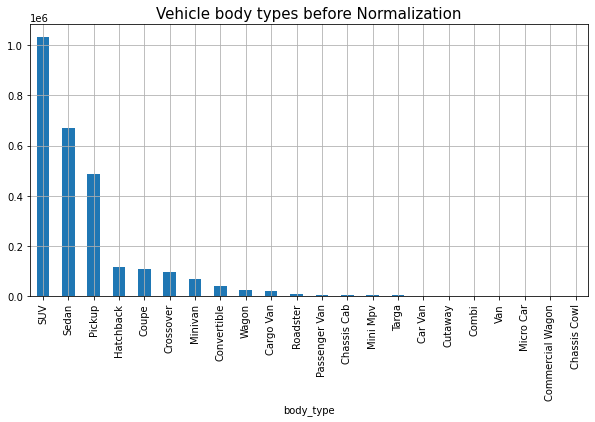

In [9]:
# Check the number of individual categories in Body_types
fig, ax = plt.subplots(figsize=(10,5))
v_df.groupby('body_type').size().sort_values(ascending=False).plot(kind='bar', grid=True)
plt.gca().set_title('Vehicle body types before Normalization', fontsize=15)
plt.show()

In [10]:
#Map the body types to most popular categories
body_type_mapping = {'SUV':'SUV', 'Sedan':'Sedan', 'Pickup':'Pickup', 'Hatchback':'Hatchback', 'Coupe':'Coupe', \
                     'Crossover':'Crossover', 'Minivan':'Minivan',\
       'Convertible':'Convertible', 'Cargo Van':'Cargo Van', 'Wagon':'Wagon', \
    'Roadster':'Roadster', 'Passenger Van':'Minivan',\
       'Chassis Cab':'Cargo Van', 'Mini Mpv':'Minivan', 'Targa':'Convertible', 'Car Van':'Minivan', 'Cutaway':'Cargo Van', \
                     'Combi':'Minivan', 'Micro Car':'Coupe', 'Van':'Minivan', 'Commercial Wagon':'Wagon'}

def normalizeBodyType(row):
    inbodytype=row.body_type
    if inbodytype is None:
        # if not in the body_type mapping, leave the body type as blank
        return np.NaN
    else: 
        return body_type_mapping.get(inbodytype,np.NaN)
# apply the normalization method on the dataset    
v_df.body_type=v_df.apply(lambda x: normalizeBodyType(x),axis=1)

#### Impute vehicle 'trim' feature with most common trim in the mode

In [11]:
#Popular trim for the make and model combination
df_model_lookup=pd.DataFrame(v_df.groupby(['make','model','trim']).size()).reset_index().rename(columns={0:'count'})

idx_t = df_model_lookup.groupby(['make','model'])['count'].transform(max)==df_model_lookup['count']

trim_lookup=df_model_lookup[idx_t]

#Save the dataframe to a csv file to use it in trim lookup method.
trim_lookup.to_csv('trim_lookup.csv',index=False)

def imputeTrim(row):
    make = row.make
    model = row.model
    trim = row.trim
    if trim ==0:
        try:
            trim= trim_lookup[(trim_lookup.make==make) & (trim_lookup.model==model)]['trim'].values[0]
        except:
            trim = model
    return trim

v_df.trim = v_df.trim.fillna(0)
v_df.trim=v_df.apply(lambda x: imputeTrim(x),axis=1)

In [12]:
# Prepare a lookup table that contains unique make, model, and trim combinations and their corresponding vehicle specifictions
# we will use this table as a look up table to get the vehile specifications if user is not able to provide those details
vin_lookup_year_df = v_df[['year', 'make', 'model', 'trim', 'vehicle_type',
       'body_type', 'drivetrain', 'fuel_type', 'engine_block', 'engine_size',
       'transmission', 'doors', 'cylinders', 'city_mpg', 'highway_mpg']]

vin_lookup_year_df = vin_lookup_year_df.dropna().drop_duplicates()

# default exterior color
ext_color=v_df.groupby(['make', 'model', 'trim','base_exterior_color']\
                           ).size().reset_index().sort_values(0, ascending=False).rename(columns = {0:'count'})

idx_c = ext_color.groupby(['make', 'model', 'trim'])['count'].transform(max)==ext_color['count']
popExtColor=ext_color[idx_c]
popExtColor=popExtColor.drop('count',axis=1).reset_index(drop=True)
#popExtColor.head()

#default interior color
int_color=v_df.groupby(['make', 'model', 'trim','base_interior_color']\
                           ).size().reset_index().sort_values(0, ascending=False).rename(columns = {0:'count'})

idx_i = int_color.groupby(['make', 'model', 'trim'])['count'].transform(max)==int_color['count']
popIntColor=int_color[idx_i]
popIntColor = popIntColor.drop('count',axis=1).reset_index(drop=True)
#popIntColor.head()

#detault state
state=v_df.groupby(['make', 'model', 'trim','state']\
                           ).size().reset_index().sort_values(0, ascending=False).rename(columns = {0:'count'})

idx_s = state.groupby(['make', 'model', 'trim'])['count'].transform(max)==state['count']
popState=state[idx_s]
popState=popState.drop('count',axis=1).reset_index(drop=True)
#popState.head()

#merge the three features to gether
color_state_lookup = popExtColor.merge(popIntColor, \
                                               left_on=['make','model','trim'],\
                                               right_on=['make','model','trim']).merge(popState,\
                                               left_on=['make','model','trim'],\
                                               right_on=['make','model','trim'])

# Merge these detault values with VIN lookup table
vin_lookup_year_df=vin_lookup_year_df.merge(color_state_lookup, left_on=['make','model','trim'],\
                                               right_on=['make','model','trim'])

vin_lookup_year_df.to_csv('vin_lookup_year.csv',index=False)

In [13]:
# No extream price outliers
v_df=v_df[v_df.price<100000]
# Remove vehicle that has a value of $0.0
v_df=v_df[v_df.price>0]

# Remove vehicles that have mgp over 150 miles
v_df = v_df[v_df.city_mpg<150]
v_df=v_df[v_df.highway_mpg<150]

# Cars no older than 1998
v_df=v_df[v_df.year>=1998]
# we observed very few vehicle over 300K miles on them
v_df = v_df[v_df.miles<300000]

#### Impute Electric vehiles enginer specification with '0' as they dont have any conventional engines

In [14]:
#We used our domain knowledge to fill these features, such as, electric vehicles don't have any cylinders or engine size. 
#So, we fill those values with zero.
electric=v_df[v_df.fuel_type=='Electric']
v_df=v_df.drop(electric.index)

electric.drivetrain = electric.drivetrain.fillna(electric.drivetrain.value_counts().index[0])
electric.fuel_type = electric.fuel_type.fillna('Electric')
electric.engine_block = electric.engine_block.fillna(0)
electric.engine_size = electric.engine_size.fillna(0)
electric.cylinders = electric.cylinders.fillna(0)
electric.transmission = electric.transmission.fillna('Automatic')
electric.doors = electric.doors.fillna(4)
electric.base_exterior_color=electric.base_exterior_color.fillna(electric.base_exterior_color.value_counts().index[0])
electric.base_interior_color=electric.base_interior_color.fillna(electric.base_interior_color.value_counts().index[0])
electric.city_mpg=electric.city_mpg.fillna(electric.city_mpg.value_counts().index[0])
electric.highway_mpg=electric.highway_mpg.fillna(electric.highway_mpg.value_counts().index[0])
electric.body_type=electric.body_type.fillna(electric.body_type.value_counts().index[0])
electric.vehicle_type=electric.vehicle_type.fillna(electric.vehicle_type.value_counts().index[0])

v_df= pd.concat([v_df, electric], ignore_index=True)

In [15]:
tesla = v_df[v_df.make=='Tesla']

v_df=v_df.drop(tesla.index)

tesla.drivetrain = tesla.drivetrain.fillna('RWD')
tesla.fuel_type = tesla.fuel_type.fillna('Electric')
tesla.engine_block = tesla.engine_block.fillna(0)
tesla.engine_size = tesla.engine_size.fillna(0)
tesla.cylinders = tesla.cylinders.fillna(0)
tesla.transmission = tesla.transmission.fillna('Automatic')
tesla.doors = tesla.doors.fillna(4)
tesla.base_exterior_color=tesla.base_exterior_color.fillna(tesla.base_exterior_color.value_counts().index[0])
tesla.base_interior_color=tesla.base_interior_color.fillna(tesla.base_interior_color.value_counts().index[0])
tesla.city_mpg=tesla.city_mpg.fillna(tesla.city_mpg.value_counts().index[0])
tesla.highway_mpg=tesla.highway_mpg.fillna(tesla.highway_mpg.value_counts().index[0])
tesla.body_type=tesla.body_type.fillna(tesla.body_type.value_counts().index[0])
tesla.vehicle_type=tesla.vehicle_type.fillna(tesla.vehicle_type.value_counts().index[0])

v_df= pd.concat([v_df, tesla], ignore_index=True)

In [16]:
# Check the missing values after imputation and filtering
percent_missing = v_df.isnull().sum() * 100 / len(v_df)
missing_value_df = pd.DataFrame({'column_name': v_df.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
price,price,0.000000
miles,miles,0.000000
year,year,0.000000
make,make,0.000000
model,model,0.000000
trim,trim,0.000000
vehicle_type,vehicle_type,0.001162
body_type,body_type,0.000000
drivetrain,drivetrain,0.000046
fuel_type,fuel_type,0.000046


#### There are about between 20 to 25 percetage of records with null values, even if we drop those records we will have plenty of data to work with. So it is safe to drop those null value records from our dataset.

In [17]:
#Drop all the vehicles that have incomplete details
v_df_NoNulls = v_df.dropna()
v_df_NoNulls = v_df_NoNulls.reset_index(drop=True)

In [18]:
#Check the data types
v_df_NoNulls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1675728 entries, 0 to 1675727
Data columns (total 23 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   price                1675728 non-null  float64
 1   miles                1675728 non-null  float64
 2   year                 1675728 non-null  int64  
 3   make                 1675728 non-null  object 
 4   model                1675728 non-null  object 
 5   trim                 1675728 non-null  object 
 6   vehicle_type         1675728 non-null  object 
 7   body_type            1675728 non-null  object 
 8   drivetrain           1675728 non-null  object 
 9   fuel_type            1675728 non-null  object 
 10  engine_block         1675728 non-null  object 
 11  engine_size          1675728 non-null  float64
 12  transmission         1675728 non-null  object 
 13  doors                1675728 non-null  float64
 14  cylinders            1675728 non-null  float64
 15

In [19]:
#Take a look at a few records
v_df_NoNulls.head()

,price,miles,year,make,model,trim,vehicle_type,body_type,drivetrain,fuel_type,...,doors,cylinders,city_mpg,highway_mpg,base_exterior_color,base_interior_color,is_certified,state,carfax_1_owner,carfax_clean_title
0,27995.0,32775.0,2020,Acura,ILX,Premium,Car,Sedan,FWD,Premium,...,4.0,4.0,24.0,34.0,White,Black,0.0,OH,1.0,1.0
1,27522.0,22838.0,2021,Acura,ILX,Premium,Car,Sedan,FWD,Premium,...,4.0,4.0,24.0,34.0,Black,Black,1.0,FL,1.0,1.0
2,26500.0,19515.0,2019,Acura,ILX,Premium,Car,Sedan,FWD,Premium,...,4.0,4.0,24.0,34.0,White,Black,0.0,NC,1.0,1.0
3,29484.0,36925.0,2020,Acura,ILX,Premium,Car,Sedan,FWD,Premium,...,4.0,4.0,24.0,34.0,White,Red,0.0,NJ,1.0,0.0
4,7495.0,91631.0,2004,Acura,TL,Base,Car,Sedan,FWD,Premium,...,4.0,6.0,20.0,28.0,Gray,Black,0.0,FL,0.0,0.0


In [20]:
#save the cleansed dataset to a csv file, this will be used in EDA and ML algoithms
v_df_NoNulls.to_csv('NotNull_FullDataset.csv',index=False)

## Exploratory Data Analysis (EDA)

In [21]:
# Load the cleaned datafile
v_df=pd.read_csv('NotNull_FullDataset.csv', engine='c',memory_map=True ,low_memory=False)

#### Prepare a pairplot to observe any visible correlations between features

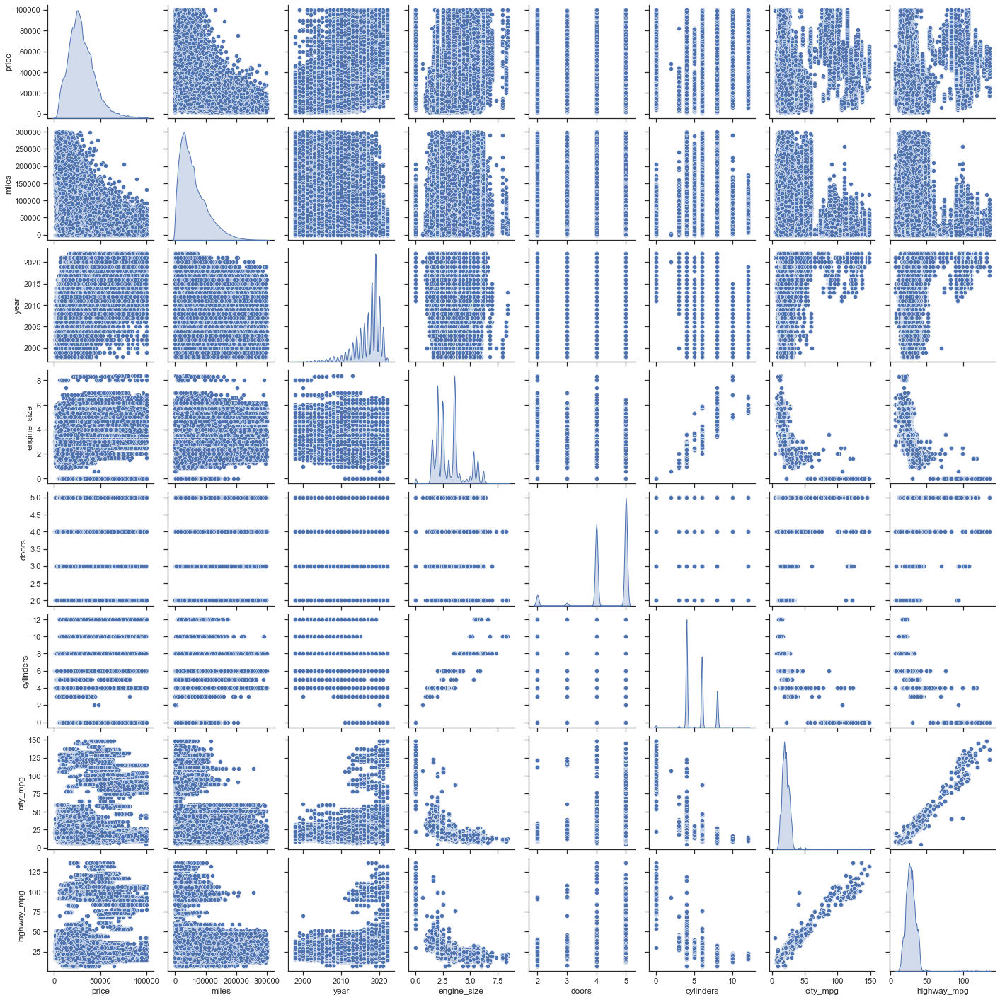

In [22]:
df_scatter_matrix =v_df_NoNulls[['price', 'miles', 'year', 'engine_size', 'doors', 'cylinders',
       'city_mpg', 'highway_mpg']]

sns.set_theme(style="ticks")
sns.pairplot(df_scatter_matrix, diag_kind='kde')
plt.show()

interval columns not set, guessing: ['price', 'miles', 'year', 'engine_size', 'doors', 'cylinders', 'city_mpg', 'highway_mpg', 'is_certified', 'carfax_1_owner', 'carfax_clean_title']


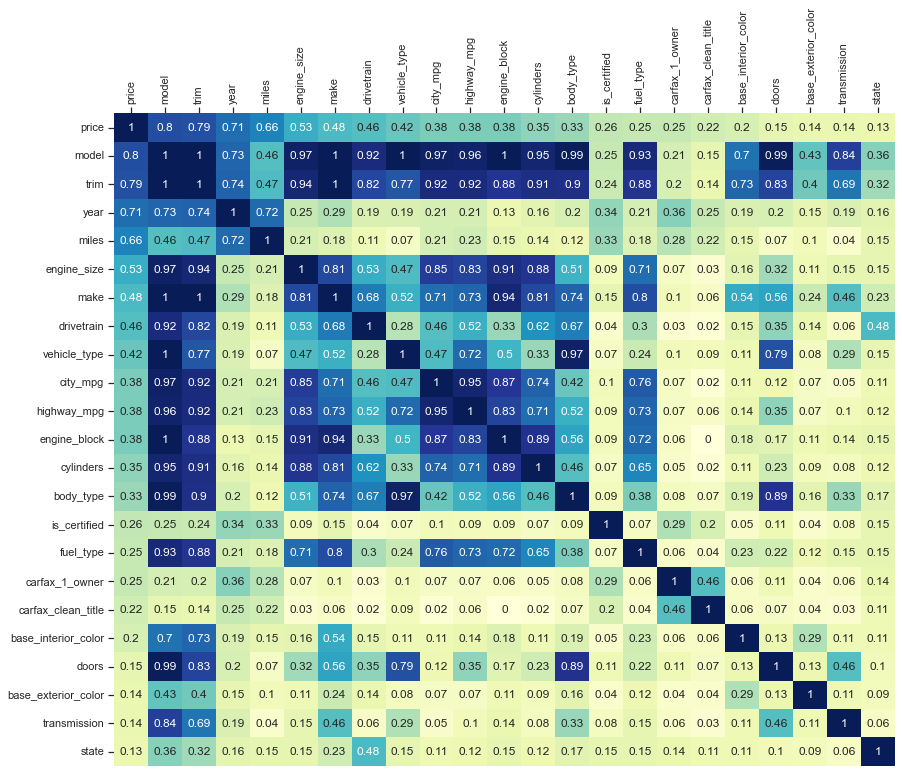

In [23]:
# get the phi_k correlation matrix between all variables,
# Pearson's correlation matrix between numeric variables
phik_overview = v_df_NoNulls.phik_matrix()

phik_overview=phik_overview.sort_values('price', ascending=False).sort_values('price', axis=1, ascending=False).round(2)

plt.figure(figsize = (14,12))
ax = sns.heatmap(phik_overview, cmap="YlGnBu", annot=True,  cbar=False)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 90)
ax.xaxis.set_ticks_position('top')
plt.show()

#### Verify target variable distribution is normal

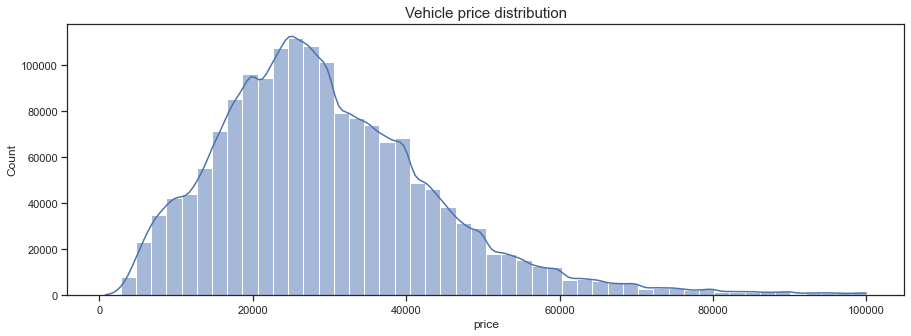

In [24]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='price', kde=True, bins=50)
plt.gca().set_title('Vehicle price distribution', fontsize=15)
plt.show()

#### Visualize the data distribution within categorical features

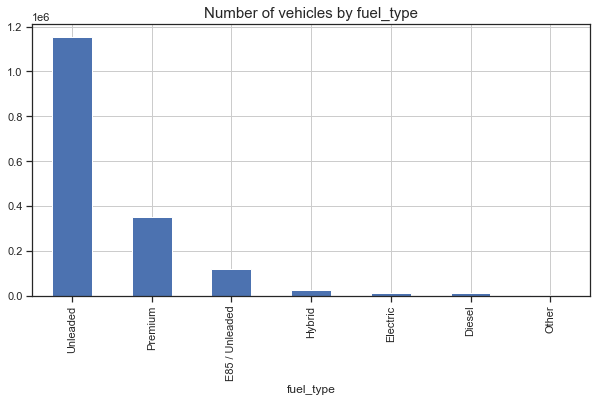

In [25]:
fig, ax = plt.subplots(figsize=(10,5))
v_df.groupby('fuel_type').size().sort_values(ascending=False).plot(kind='bar', grid=True)
plt.gca().set_title('Number of vehicles by fuel_type', fontsize=15)
plt.show()

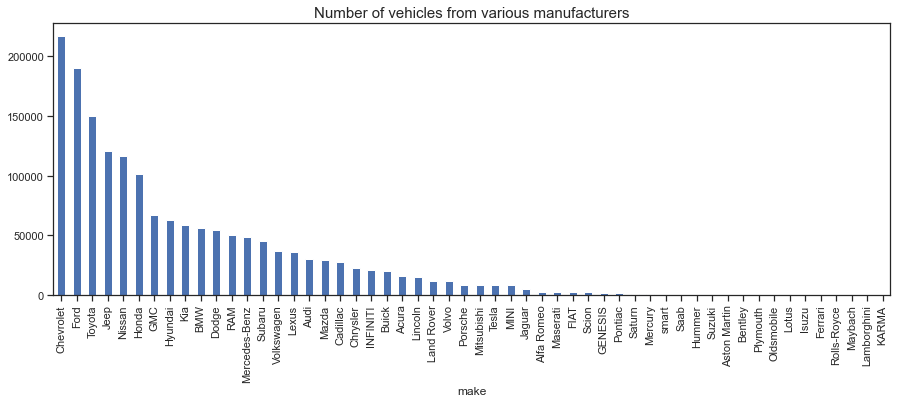

In [26]:
fig, ax = plt.subplots(figsize=(15,5))

v_df.groupby('make').size().sort_values(ascending=False).plot(kind='bar')
plt.gca().set_title('Number of vehicles from various manufacturers', fontsize=15)
plt.show()

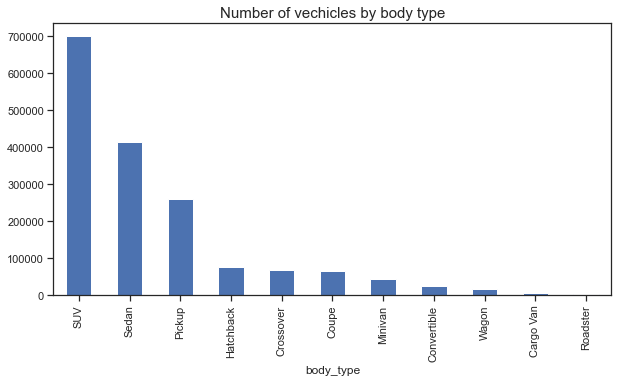

In [27]:
fig, ax = plt.subplots(figsize=(10,5))
v_df.groupby('body_type').size().sort_values(ascending=False).plot(kind='bar')
plt.gca().set_title('Number of vechicles by body type', fontsize=15)
plt.show()

#### Verify price distribution in verious categorical features

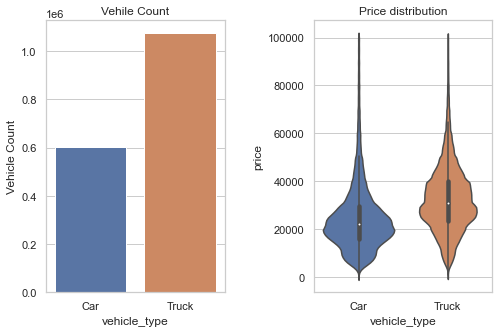

In [28]:
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(8,5))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="vehicle_type",y='Vehicle Count' ,\
            data=v_df.groupby('vehicle_type').size()\
            .reset_index().rename(columns={0:'Vehicle Count'}), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="vehicle_type", y="price", data=v_df, showmeans=True, ax=axes[1]).set(title='Price distribution')
plt.show()

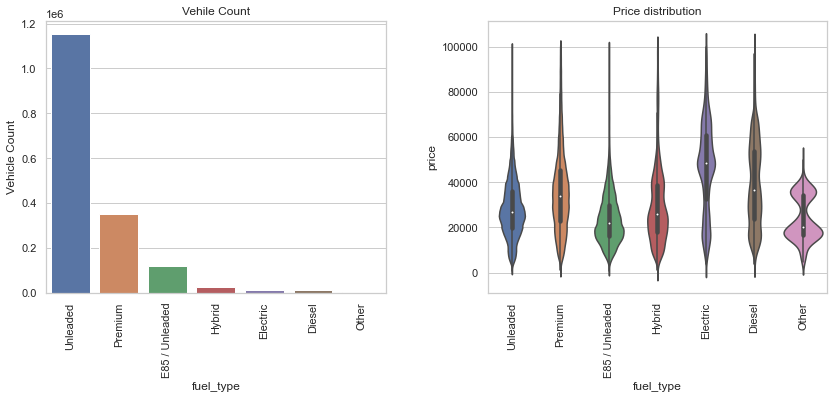

In [29]:
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14,5))
plt.subplots_adjust(wspace=.3)

data=v_df.groupby('fuel_type').size().sort_values(ascending=False)\
            .reset_index().rename(columns={0:'Vehicle Count'})

sns.barplot(x="fuel_type",y='Vehicle Count' ,\
            data=data, ax=axes[0]).set (title='Vehile Count')
axes[0].tick_params(axis='x', rotation=90)


sns.violinplot(x="fuel_type", y="price", data=v_df, order=data.fuel_type,showmeans=True, ax=axes[1]).set(title='Price distribution')
axes[1].tick_params(axis='x', rotation=90)
plt.show()

##### Check the percentage of Electric+Hybrid vehicles in the dataset

In [30]:
fuel_type_data = v_df.fuel_type.value_counts().reset_index().rename(columns={'index':'Fuel', 'fuel_type':'Count'})
fuel_type_data['Percentage'] = fuel_type_data.Count/fuel_type_data.Count.sum()
display(fuel_type_data)

,Fuel,Count,Percentage
0,Unleaded,1154786,0.689125
1,Premium,350402,0.209104
2,E85 / Unleaded,120487,0.071901
3,Hybrid,25390,0.015152
4,Electric,13912,0.008302
5,Diesel,10156,0.006061
6,Other,595,0.000355


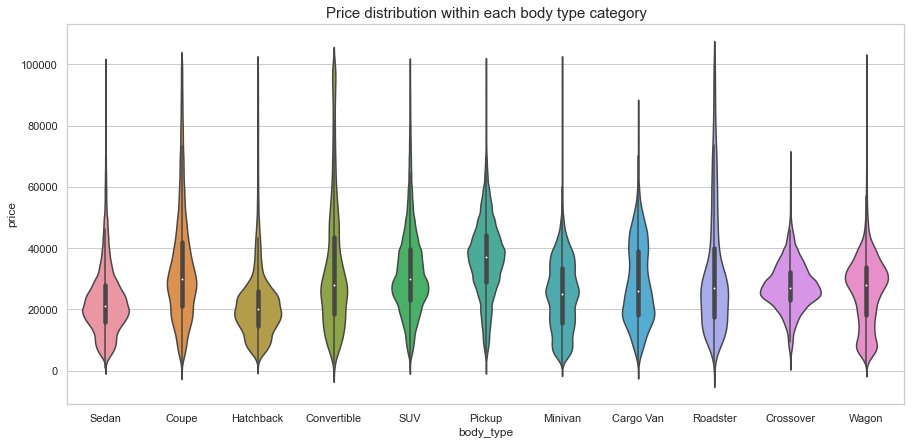

In [31]:
fig, ax = plt.subplots(figsize=(15,7))
ax = sns.violinplot(x="body_type", y="price", data=v_df, showmeans=True)
plt.gca().set_title('Price distribution within each body type category', fontsize=15)
plt.show()

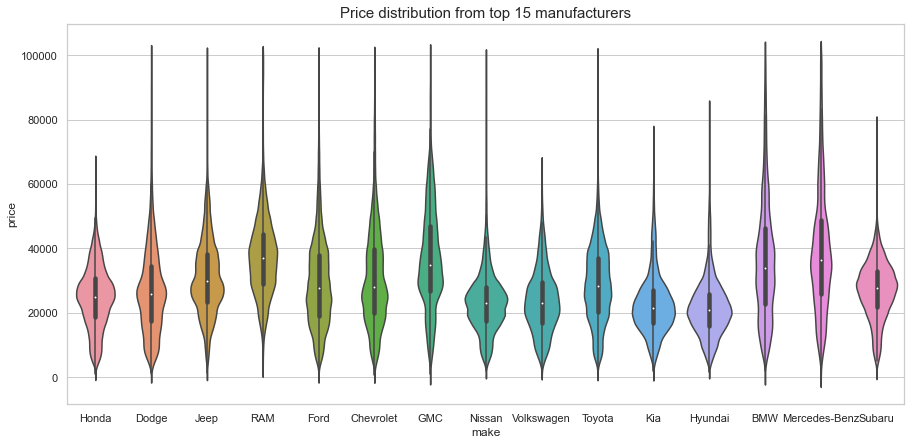

In [32]:
top_makes = v_df.groupby('make').size().sort_values(ascending=False).head(15).index
fig, ax = plt.subplots(figsize=(15,7))
v_df_topmakes = v_df[v_df.make.isin(top_makes)]
plt.gca().set_title('Price distribution from top 15 manufacturers', fontsize=15)
ax = sns.violinplot(x="make", y="price", data=v_df_topmakes, showmeans=True)

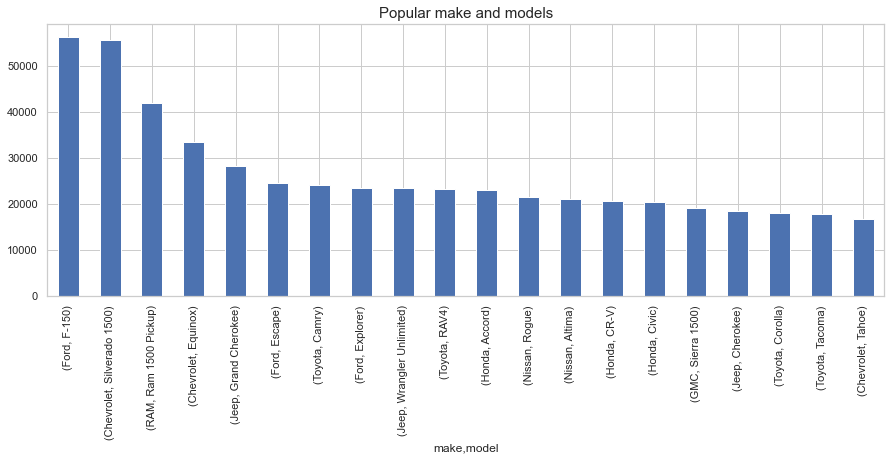

In [33]:
fig, ax = plt.subplots(figsize=(15,5))
v_df.groupby(['make','model']).size().sort_values(ascending=False)[:20].plot(kind='bar')
plt.gca().set_title('Popular make and models', fontsize=15)
plt.show()

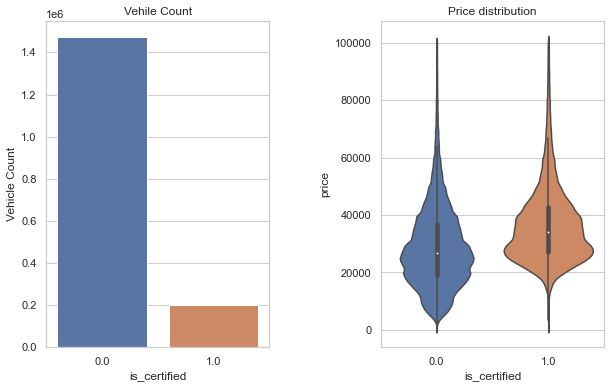

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(10,6))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="is_certified",y='Vehicle Count' ,\
            data=v_df.groupby('is_certified').size().sort_values(ascending=False)\
            .reset_index().rename(columns={0:'Vehicle Count'}), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="is_certified", y="price", data=v_df, showmeans=True, ax=axes[1]).set(title='Price distribution')
plt.show()

<AxesSubplot:xlabel='price', ylabel='Count'>

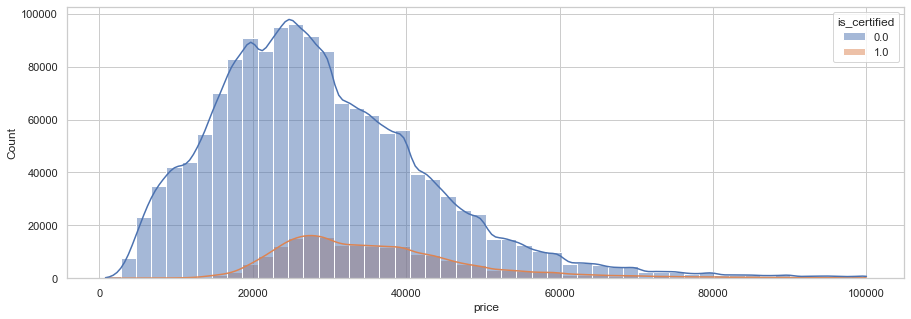

In [35]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='price', kde=True, bins=50, hue='is_certified' )

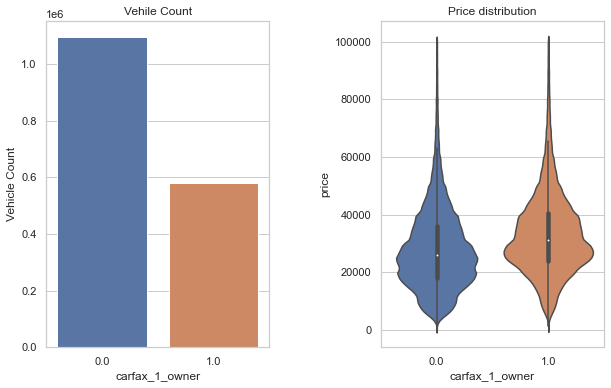

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(10,6))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="carfax_1_owner",y='Vehicle Count' ,\
            data=v_df.groupby('carfax_1_owner').size().sort_values(ascending=False)\
            .reset_index().rename(columns={0:'Vehicle Count'}), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="carfax_1_owner", y="price", data=v_df, \
                ax=axes[1]).set(title='Price distribution')
plt.show()

<AxesSubplot:xlabel='price', ylabel='Count'>

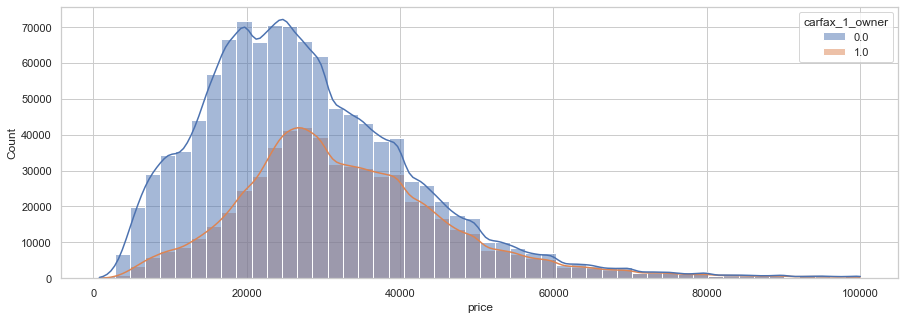

In [37]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='price', kde=True, bins=50, hue='carfax_1_owner' )

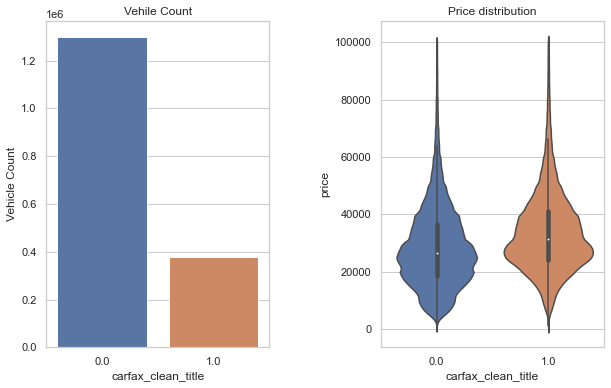

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(10,6))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="carfax_clean_title",y='Vehicle Count' ,\
            data=v_df.groupby('carfax_clean_title').size().sort_values(ascending=False)\
            .reset_index().rename(columns={0:'Vehicle Count'}), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="carfax_clean_title", y="price", data=v_df, \
                ax=axes[1]).set(title='Price distribution')
plt.show()

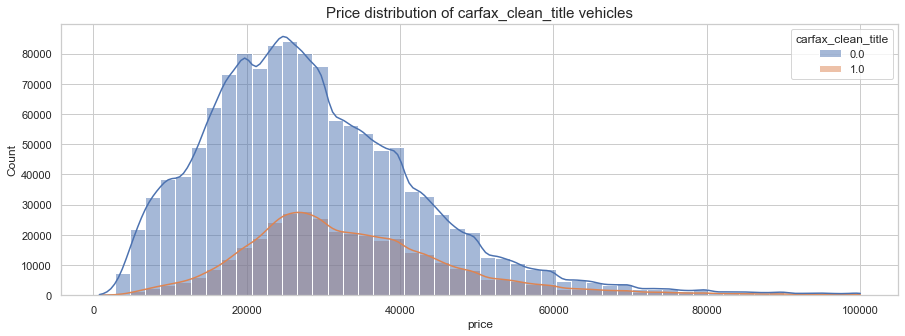

In [39]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='price', kde=True, bins=50, hue='carfax_clean_title' )
plt.gca().set_title('Price distribution of carfax_clean_title vehicles', fontsize=15)
plt.show()

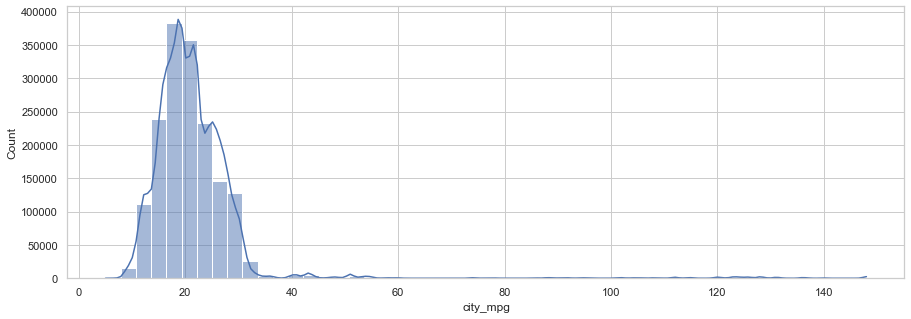

In [40]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='city_mpg', kde=True, bins=50)
plt.show()

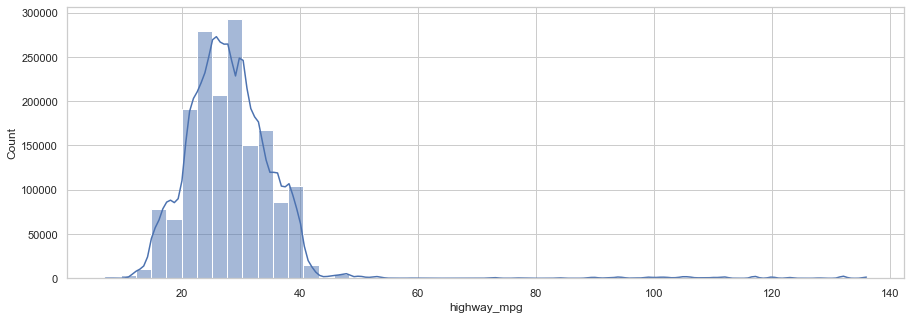

In [41]:
fig, ax = plt.subplots(figsize=(15,5))
sns.histplot(data=v_df, x='highway_mpg', kde=True, bins=50)
plt.show()

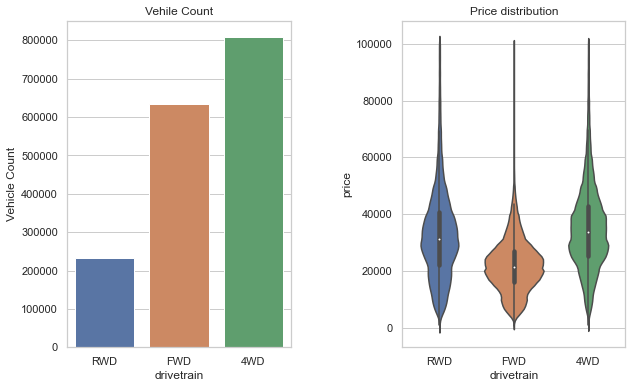

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(10,6))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="drivetrain",y='Vehicle Count' ,\
            data=v_df.groupby('drivetrain').size()\
            .reset_index().rename(columns={0:'Vehicle Count'}\
                                 ).sort_values('Vehicle Count'), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="drivetrain", y="price", order=['RWD','FWD','4WD'], data=v_df, \
                ax=axes[1]).set(title='Price distribution')
plt.show()

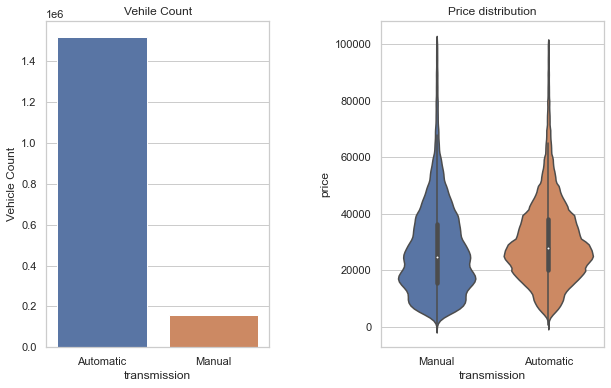

In [43]:

fig, axes = plt.subplots(1, 2, figsize=(10,6))
plt.subplots_adjust(wspace=.5)
sns.barplot(x="transmission",y='Vehicle Count' ,\
            data=v_df.groupby('transmission').size()\
            .reset_index().rename(columns={0:'Vehicle Count'}), ax=axes[0]).set (title='Vehile Count')

sns.violinplot(x="transmission", y="price",  data=v_df, \
                ax=axes[1]).set(title='Price distribution')
plt.show()


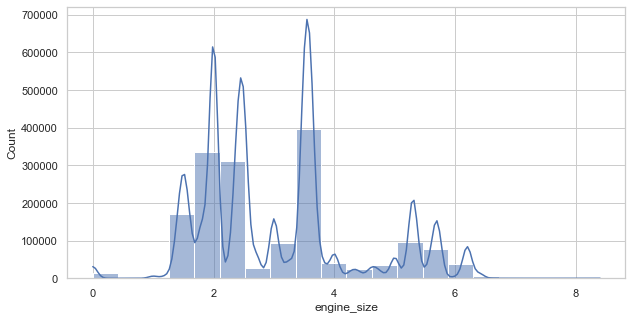

In [44]:
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(data=v_df, x='engine_size', kde=True, bins=20)
plt.show()

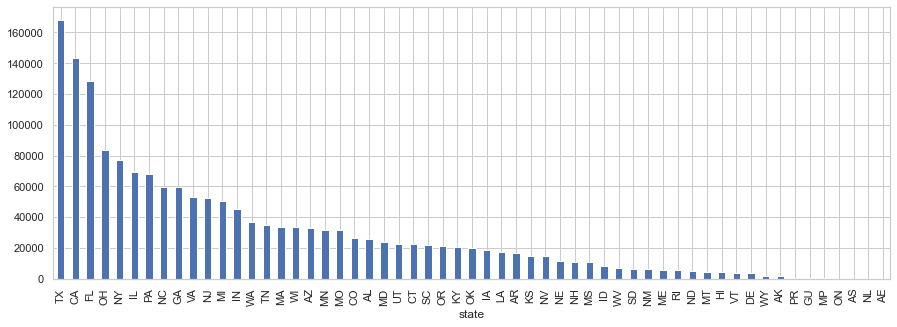

In [45]:
fig, ax = plt.subplots(figsize=(15,5))
v_df.groupby('state').size().sort_values(ascending=False).plot(kind='bar')
plt.show()

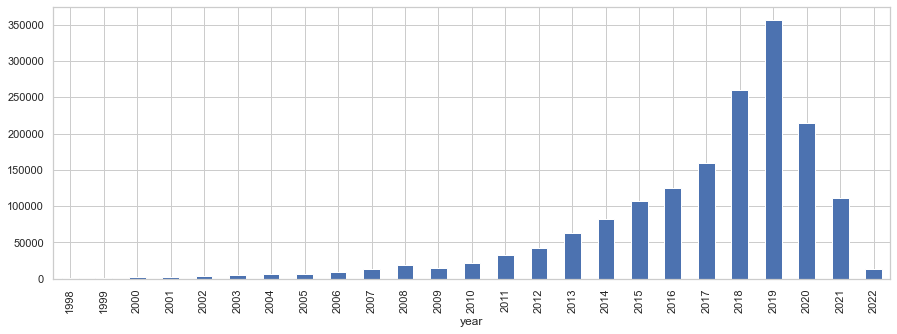

In [46]:
fig, ax = plt.subplots(figsize=(15,5))
#v_df.groupby('year').size().sort_values(ascending=False).plot(kind='bar')
v_df.groupby('year').size().plot(kind='bar')
plt.show()

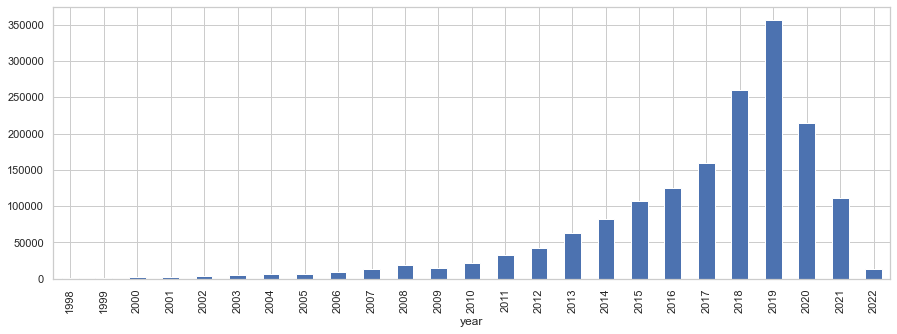

In [47]:
fig, ax = plt.subplots(figsize=(15,5))
v_df.groupby('year').size().plot(kind='bar')
plt.show()

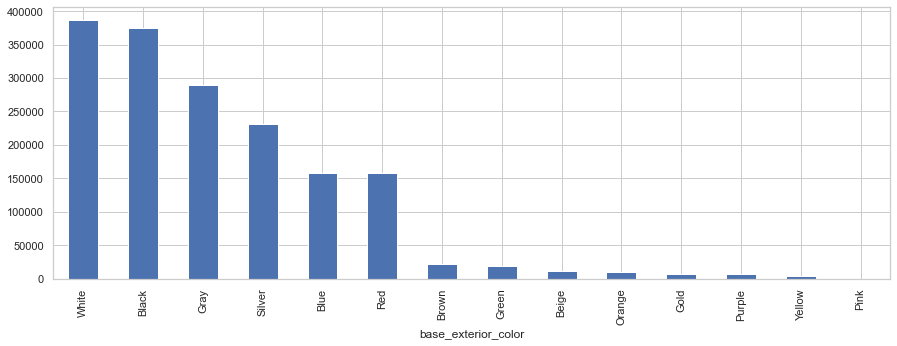

In [48]:
fig, ax = plt.subplots(figsize=(15,5))
v_df.groupby('base_exterior_color').size().sort_values(ascending=False).plot(kind='bar')
plt.show()

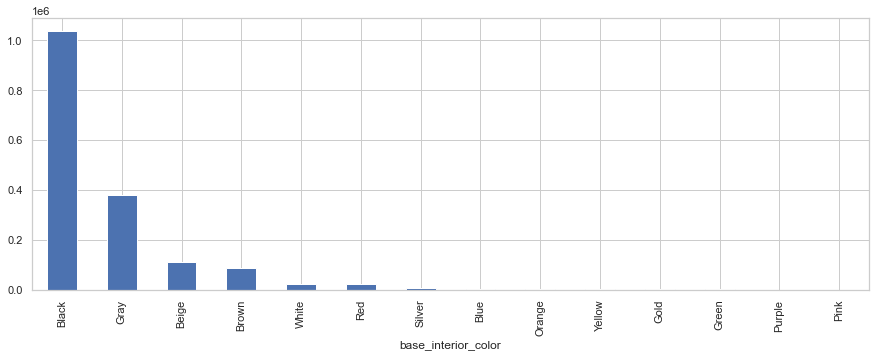

In [49]:
fig, ax = plt.subplots(figsize=(15,5))
v_df.groupby('base_interior_color').size().sort_values(ascending=False).plot(kind='bar')
plt.show()

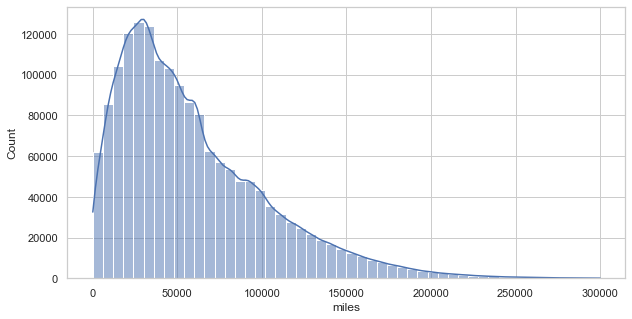

In [50]:
#Lets look at the distribution of miles as well
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(data=v_df, x='miles', kde=True, bins=50)
plt.show()

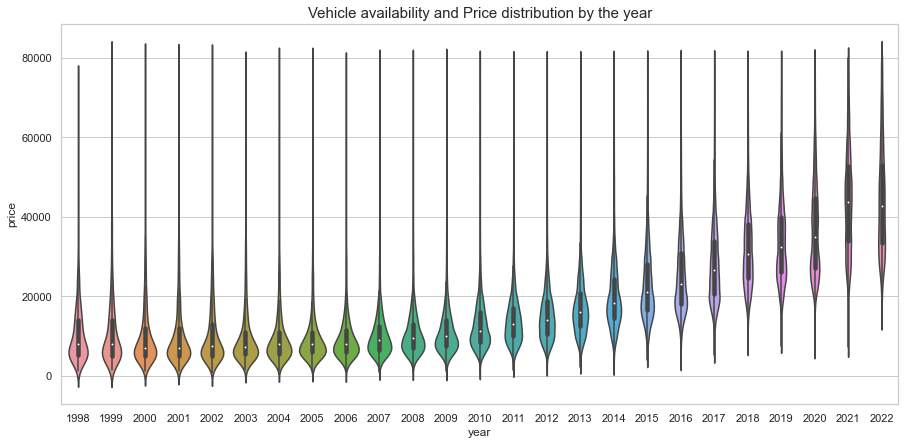

In [55]:
fig, ax = plt.subplots(figsize=(15,7))
ax = sns.violinplot(x="year", y="price", data=v_df[v_df.price<80000], showmeans=True)
plt.gca().set_title('Vehicle availability and Price distribution by the year', fontsize=15)
plt.show()